In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        os.path.join(dirname, filename)

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [38]:
import warnings
warnings.simplefilter('ignore')
import numpy as np
import os
import matplotlib.pyplot as plt
import tensorflow as tf
print(f"tensorflow version: {tf.__version__}")
from tensorflow.keras import layers, models, Sequential
from tensorflow.keras.layers import Input, Conv2DTranspose, BatchNormalization, ReLU, Conv2D, LeakyReLU
import time
from tqdm import tqdm

tensorflow version: 2.17.1


# **1- DCGANs**

## **1-1- Load Dataset**

<div style="background-color: green; padding: 20px; border-radius: 25px; ">
<font color='white' size="5px">
The script loads a dataset of images from a specified directory using TensorFlow's image_dataset_from_directory function. The dataset is configured to not include labels.
    </font>
</div>

In [39]:
img_height, img_width, batch_size = 128, 128, 128

# Load dataset with labels
train_ds = tf.keras.utils.image_dataset_from_directory(
    directory='/kaggle/input/face-mask-lite-dataset/without_mask',
    image_size=(img_height, img_width),
    batch_size=batch_size,
    label_mode=None
)

Found 10000 files.


## **1-2- Normalize Dataset**

<div style="background-color: green; padding: 20px; border-radius: 25px; ">
<font color='white' size="5px">
A normalization layer is applied to scale the images to the range [-1, 1].
    </font>
</div>

In [40]:
# Apply normalization
normalization_layer = tf.keras.layers.Rescaling(scale=1./127.5, offset=-1)
normalized_ds = train_ds.map(lambda x: normalization_layer(x))

## **1-3- Visualization Function**

<div style="background-color: green; padding: 20px; border-radius: 25px; ">
<font color='white' size="5px">
A helper function, plot_array, is defined to visualize a batch of images.
    </font>
</div>

In [41]:
# Extract images from the first batch and convert to list
images = train_ds.take(1)
X = [x for x in images]

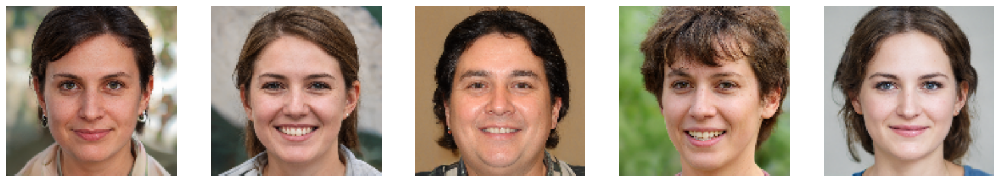

In [42]:
def plot_array(X, title=""):
    plt.rcParams['figure.figsize'] = (20, 20)
    for i, x in enumerate(X[0:5]):
        x = x.numpy()
        max_ = x.max()
        min_ = x.min()
        xnew = np.uint(255 * (x - min_) / (max_ - min_))
        plt.subplot(1, 5, i + 1)
        plt.imshow(xnew)
        plt.axis("off")
    plt.show()

plot_array(X[0])

## **1-4- Generator Model**

<div style="background-color: green; padding: 20px; border-radius: 25px; ">
<font color='white' size="5px">
The function make_generator defines the architecture of the generator model using Conv2DTranspose layers and BatchNormalization layers.
    </font>
</div>

In [43]:
def make_generator():
    model = Sequential()
    model.add(Input(shape=(1, 1, 100), name='input_layer'))
    model.add(Conv2DTranspose(128 * 8, kernel_size=4, strides=4, padding='same', kernel_initializer=tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.02), use_bias=False, name='conv_transpose_1'))
    model.add(BatchNormalization(momentum=0.1, epsilon=0.8, center=1.0, scale=0.02, name='bn_1'))
    model.add(ReLU(name='relu_1'))

    model.add(Conv2DTranspose(128 * 4, kernel_size=4, strides=2, padding='same', kernel_initializer=tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.02), use_bias=False, name='conv_transpose_2'))
    model.add(BatchNormalization(momentum=0.1, epsilon=0.8, center=1.0, scale=0.02, name='bn_2'))
    model.add(ReLU(name='relu_2'))

    model.add(Conv2DTranspose(128 * 2, kernel_size=4, strides=2, padding='same', kernel_initializer=tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.02), use_bias=False, name='conv_transpose_3'))
    model.add(BatchNormalization(momentum=0.1, epsilon=0.8, center=1.0, scale=0.02, name='bn_3'))
    model.add(ReLU(name='relu_3'))

    model.add(Conv2DTranspose(128 * 1, kernel_size=4, strides=2, padding='same', kernel_initializer=tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.02), use_bias=False, name='conv_transpose_4'))
    model.add(BatchNormalization(momentum=0.1, epsilon=0.8, center=1.0, scale=0.02, name='bn_4'))
    model.add(ReLU(name='relu_4'))

    model.add(Conv2DTranspose(3, 4, 2, padding='same', kernel_initializer=tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.02), use_bias=False, activation='tanh', name='conv_transpose_5'))

    return model

## **1-5- Discriminator Model**

<div style="background-color: green; padding: 20px; border-radius: 25px; ">
<font color='white' size="5px">
The function make_discriminator defines the architecture of the discriminator model using Conv2D layers and BatchNormalization layers.
    </font>
</div>

In [44]:
def make_discriminator():
    model = Sequential()
    model.add(Input(shape=(128, 128, 3), name='input_layer'))
    model.add(Conv2D(128, kernel_size=4, strides=2, padding='same', kernel_initializer=tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.02), use_bias=False, name='conv_1'))
    model.add(LeakyReLU(0.2, name='leaky_relu_1'))

    model.add(Conv2D(128 * 2, kernel_size=4, strides=2, padding='same', kernel_initializer=tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.02), use_bias=False, name='conv_2'))
    model.add(BatchNormalization(momentum=0.1, epsilon=0.8, center=1.0, scale=0.02, name='bn_1'))
    model.add(LeakyReLU(0.2, name='leaky_relu_2'))

    model.add(Conv2D(128 * 4, 4, 2, padding='same', kernel_initializer=tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.02), use_bias=False, name='conv_3'))
    model.add(BatchNormalization(momentum=0.1, epsilon=0.8, center=1.0, scale=0.02, name='bn_2'))
    model.add(LeakyReLU(0.2, name='leaky_relu_3'))

    model.add(Conv2D(128 * 8, 4, 2, padding='same', kernel_initializer=tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.02), use_bias=False, name='conv_4'))
    model.add(BatchNormalization(momentum=0.1, epsilon=0.8, center=1.0, scale=0.02, name='bn_3'))
    model.add(LeakyReLU(0.2, name='leaky_relu_4'))

    model.add(Conv2D(1, 4, 2, padding='same', kernel_initializer=tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.02), use_bias=False, activation='sigmoid', name='conv_5'))

    return model

## **1-6- Loss Functions**

<div style="background-color: green; padding: 20px; border-radius: 25px; ">
<font color='white' size="5px">
Loss functions for the generator and discriminator are defined using binary cross-entropy.
    </font>
</div>

In [45]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def generator_loss(Xhat):
    return cross_entropy(tf.ones_like(Xhat), Xhat)

def discriminator_loss(X, Xhat):
    real_loss = cross_entropy(tf.ones_like(X), X)
    fake_loss = cross_entropy(tf.zeros_like(Xhat), Xhat)
    total_loss = 0.5 * (real_loss + fake_loss)
    return total_loss

## **1-7- Optimizers**

<div style="background-color: green; padding: 20px; border-radius: 25px; ">
<font color='white' size="5px">
Adam optimizers are instantiated for both the generator and the discriminator.
    </font>
</div>

In [46]:
learning_rate = 0.0002

generator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5, beta_2=0.999)
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5, beta_2=0.999)

## **1-8- Training Step**

<div style="background-color: green; padding: 20px; border-radius: 25px; ">
<font color='white' size="5px">
The train_step function is defined to execute one training step for the GAN, including forward passes and backpropagation for both models.
    </font>
</div>

In [47]:
@tf.function
def train_step(X):
    z = tf.random.normal([BATCH_SIZE, 1, 1, latent_dim])
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        xhat = generator(z, training=True)
        real_output = discriminator(X, training=True)
        fake_output = discriminator(xhat, training=True)
        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

In [48]:
BATCH_SIZE = 128
latent_dim = 100
generator = make_generator()
discriminator = make_discriminator()

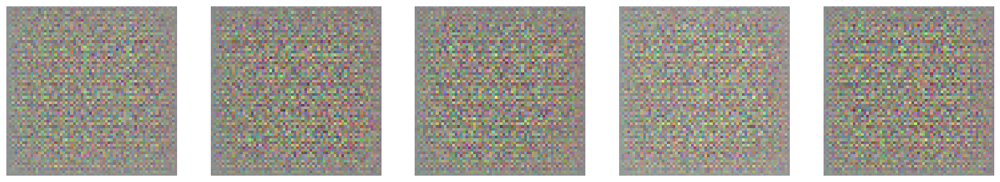

In [49]:
# Generate initial images to visualize generator output
noise = tf.random.normal([BATCH_SIZE, 1, 1, latent_dim])
Xhat = generator(noise, training=False)
plot_array(Xhat)

## **1-9- Training Loop**

<div style="background-color: green; padding: 20px; border-radius: 25px; ">
<font color='white' size="5px">
The script includes a training loop for a specified number of epochs. During each epoch, batches of images are processed, and the generator's output is visualized.
    </font>
</div>

epoch 1: 100%|██████████| 79/79 [02:21<00:00,  1.80s/it]


original images


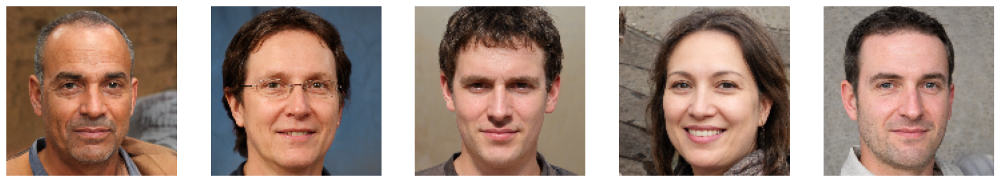

generated images


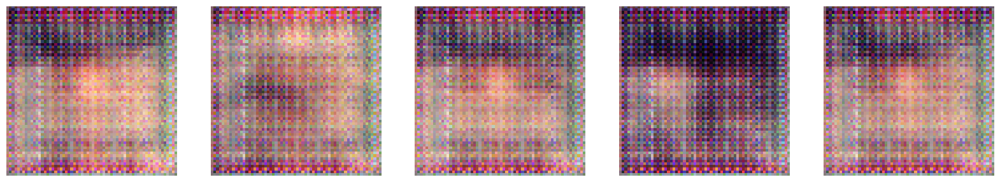

Time for epoch 1 is 284.3739974498749 sec


epoch 2: 100%|██████████| 79/79 [02:21<00:00,  1.80s/it]


original images


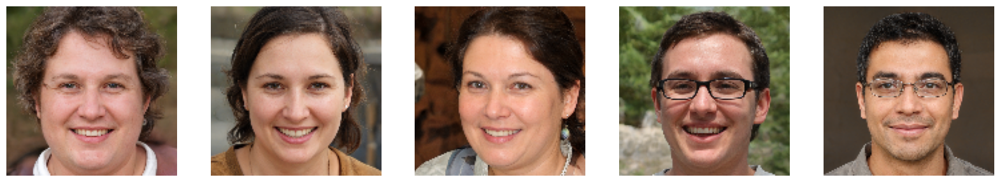

generated images


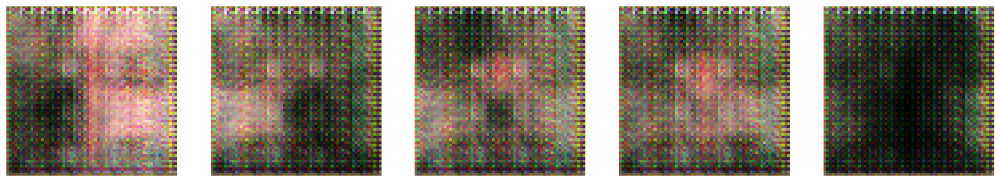

Time for epoch 2 is 269.8405740261078 sec


epoch 3: 100%|██████████| 79/79 [02:21<00:00,  1.80s/it]


original images


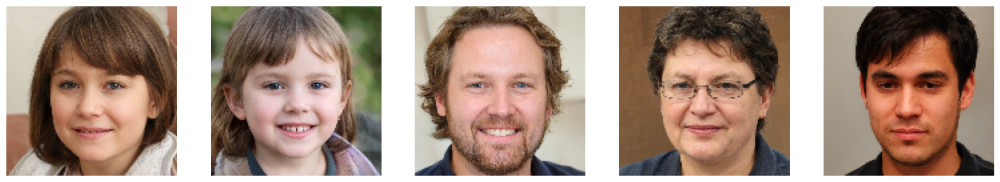

generated images


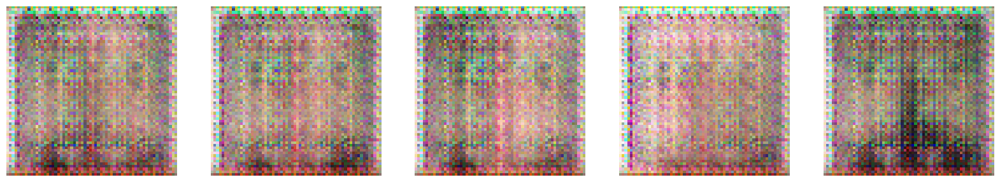

Time for epoch 3 is 269.60053992271423 sec


epoch 4: 100%|██████████| 79/79 [02:21<00:00,  1.80s/it]


original images


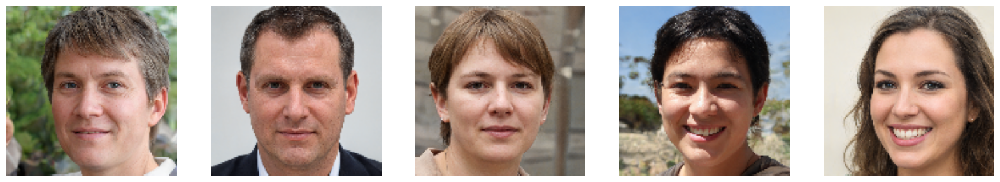

generated images


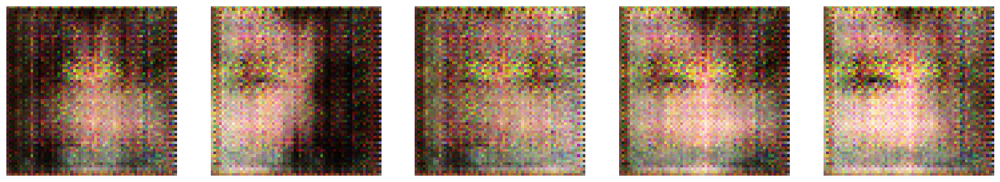

Time for epoch 4 is 269.9373462200165 sec


epoch 5: 100%|██████████| 79/79 [02:21<00:00,  1.80s/it]


original images


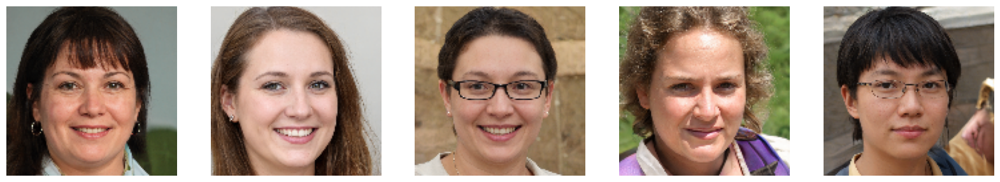

generated images


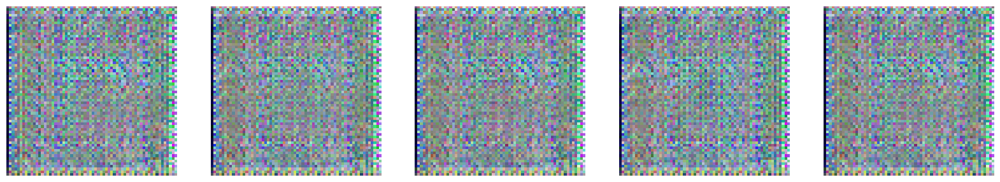

Time for epoch 5 is 269.3479301929474 sec


epoch 6: 100%|██████████| 79/79 [02:21<00:00,  1.80s/it]


original images


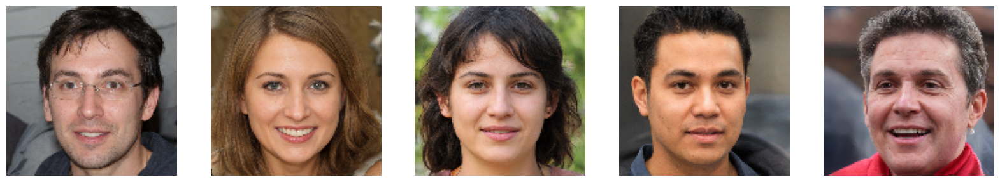

generated images


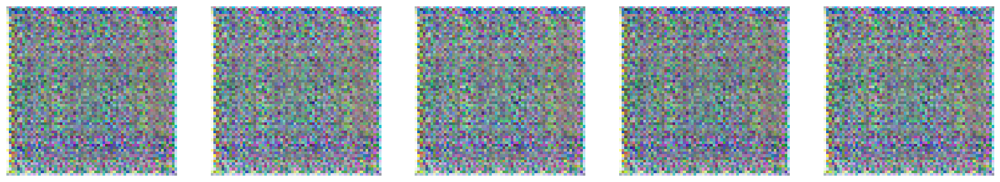

Time for epoch 6 is 284.37673830986023 sec


epoch 7: 100%|██████████| 79/79 [02:09<00:00,  1.64s/it]


original images


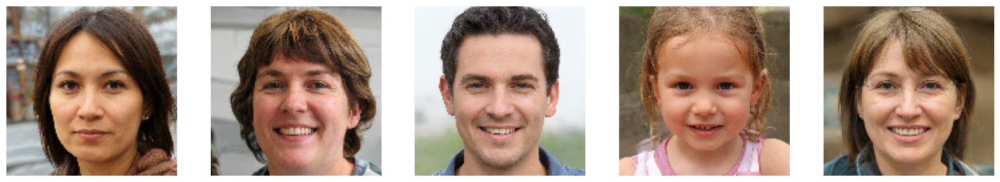

generated images


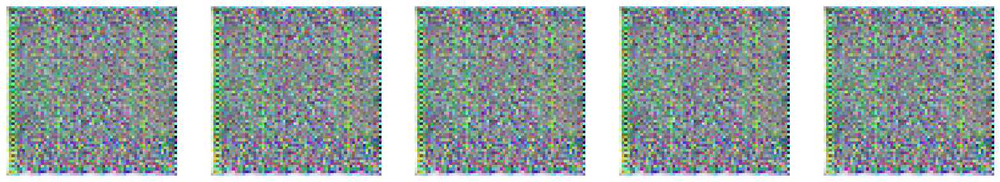

Time for epoch 7 is 272.7674038410187 sec


epoch 8: 100%|██████████| 79/79 [02:09<00:00,  1.64s/it]


original images


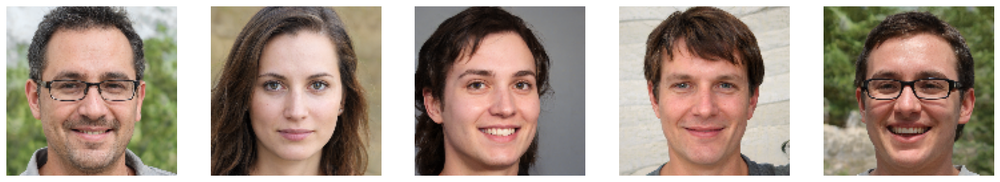

generated images


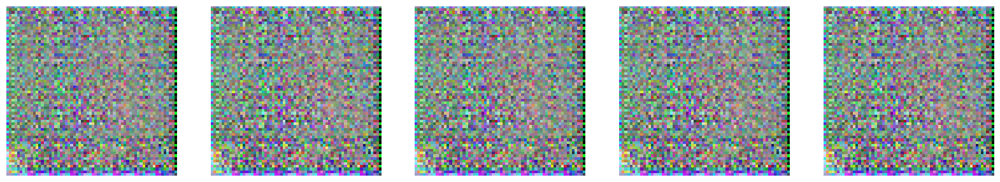

Time for epoch 8 is 257.7203323841095 sec


epoch 9: 100%|██████████| 79/79 [02:21<00:00,  1.80s/it]


original images


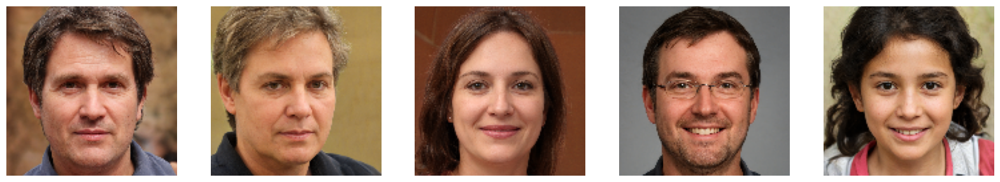

generated images


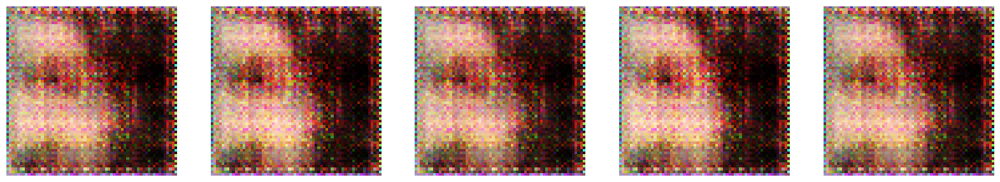

Time for epoch 9 is 269.47610878944397 sec


epoch 10: 100%|██████████| 79/79 [02:21<00:00,  1.80s/it]


original images


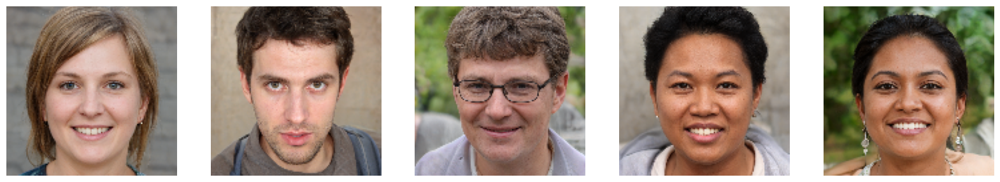

generated images


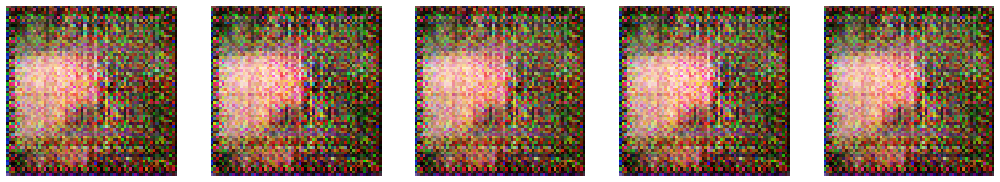

Time for epoch 10 is 269.93112349510193 sec


In [51]:
epochs = 10

for epoch in range(epochs):
    start = time.time()
    i = 0
    for X in tqdm(normalized_ds, desc=f"epoch {epoch + 1}", total=len(normalized_ds)):
        i += 1
        if i % 1000 == 0:
            print("epoch {}, iteration {}".format(epoch + 1, i))
        train_step(X)

    noise = tf.random.normal([BATCH_SIZE, 1, 1, latent_dim])
    Xhat = generator(noise, training=False)
    X = [x for x in normalized_ds]
    print("original images")
    plot_array(X[0])
    print("generated images")
    plot_array(Xhat)
    print('Time for epoch {} is {} sec'.format(epoch + 1, time.time() - start))

# **2- CycleGans**

In [53]:
# Constants
IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS = 128, 128, 3
BATCH_SIZE = 16
LATENT_DIM = 100

## **2-1- Load datasets**

In [54]:
train_ds_A = tf.keras.utils.image_dataset_from_directory(
    directory='/kaggle/input/face-mask-lite-dataset/without_mask',
    image_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    label_mode=None
)

train_ds_B = tf.keras.utils.image_dataset_from_directory(
    directory='/kaggle/input/face-mask-lite-dataset/with_mask',
    image_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    label_mode=None
)

Found 10000 files.
Found 10000 files.


## **2-2- Normalize images**

In [55]:
normalization_layer = tf.keras.layers.Rescaling(scale=1./127.5, offset=-1)
train_ds_A = train_ds_A.map(lambda x: normalization_layer(x))
train_ds_B = train_ds_B.map(lambda x: normalization_layer(x))

## **2-3- Generator Model**

In [56]:
def make_generator():
    def residual_block(x):
        y = layers.Conv2D(256, 3, padding='same')(x)
        y = BatchNormalization()(y)
        y = ReLU()(y)
        y = layers.Conv2D(256, 3, padding='same')(y)
        y = BatchNormalization()(y)
        return layers.add([x, y])

    inputs = Input(shape=(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    x = layers.Conv2D(64, 7, padding='same')(inputs)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    # Downsampling
    x = layers.Conv2D(128, 3, strides=2, padding='same')(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    x = layers.Conv2D(256, 3, strides=2, padding='same')(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    # Residual blocks
    for _ in range(6):
        x = residual_block(x)

    # Upsampling
    x = layers.Conv2DTranspose(128, 3, strides=2, padding='same')(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    x = layers.Conv2DTranspose(64, 3, strides=2, padding='same')(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    # Output layer
    outputs = layers.Conv2D(IMG_CHANNELS, 7, padding='same', activation='tanh')(x)
    return models.Model(inputs, outputs)

## **2-4- Discriminator Model**

In [57]:
def make_discriminator():
    inputs = Input(shape=(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
    x = layers.Conv2D(64, 4, strides=2, padding='same')(inputs)
    x = LeakyReLU(0.2)(x)

    x = layers.Conv2D(128, 4, strides=2, padding='same')(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(0.2)(x)

    x = layers.Conv2D(256, 4, strides=2, padding='same')(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(0.2)(x)

    x = layers.Conv2D(512, 4, strides=2, padding='same')(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(0.2)(x)

    outputs = layers.Conv2D(1, 4, padding='same', activation='sigmoid')(x)
    return models.Model(inputs, outputs)

In [58]:
# Initialize generators and discriminators
generator_A_to_B = make_generator()
generator_B_to_A = make_generator()
discriminator_A = make_discriminator()
discriminator_B = make_discriminator()

## **2-5- Loss functions**

In [59]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=False)
LAMBDA_CYCLE = 10.0

def discriminator_loss(real, generated):
    real_loss = cross_entropy(tf.ones_like(real), real)
    generated_loss = cross_entropy(tf.zeros_like(generated), generated)
    return (real_loss + generated_loss) * 0.5

def generator_loss(generated):
    return cross_entropy(tf.ones_like(generated), generated)

def cycle_consistency_loss(real, cycled):
    return tf.reduce_mean(tf.abs(real - cycled))

## **2-6 Optimizers**

In [60]:
generator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5)

## **2-7- Training step**

In [61]:
@tf.function
def train_step(real_A, real_B):
    with tf.GradientTape(persistent=True) as tape:
        # Forward pass
        fake_B = generator_A_to_B(real_A, training=True)
        cycled_A = generator_B_to_A(fake_B, training=True)

        fake_A = generator_B_to_A(real_B, training=True)
        cycled_B = generator_A_to_B(fake_A, training=True)

        # Discriminator outputs
        disc_real_A = discriminator_A(real_A, training=True)
        disc_fake_A = discriminator_A(fake_A, training=True)

        disc_real_B = discriminator_B(real_B, training=True)
        disc_fake_B = discriminator_B(fake_B, training=True)

        # Losses
        gen_A_to_B_loss = generator_loss(disc_fake_B)
        gen_B_to_A_loss = generator_loss(disc_fake_A)

        cycle_loss_A = cycle_consistency_loss(real_A, cycled_A)
        cycle_loss_B = cycle_consistency_loss(real_B, cycled_B)

        total_gen_loss = gen_A_to_B_loss + gen_B_to_A_loss + LAMBDA_CYCLE * (cycle_loss_A + cycle_loss_B)

        disc_A_loss = discriminator_loss(disc_real_A, disc_fake_A)
        disc_B_loss = discriminator_loss(disc_real_B, disc_fake_B)

    # Apply gradients
    generator_gradients = tape.gradient(total_gen_loss, generator_A_to_B.trainable_variables + generator_B_to_A.trainable_variables)
    discriminator_gradients = tape.gradient([disc_A_loss, disc_B_loss], discriminator_A.trainable_variables + discriminator_B.trainable_variables)

    generator_optimizer.apply_gradients(zip(generator_gradients, generator_A_to_B.trainable_variables + generator_B_to_A.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients, discriminator_A.trainable_variables + discriminator_B.trainable_variables))

## **2-8- Training loop**

Epoch 1: 100%|██████████| 625/625 [14:16<00:00,  1.37s/it]


Original Images from Domain A


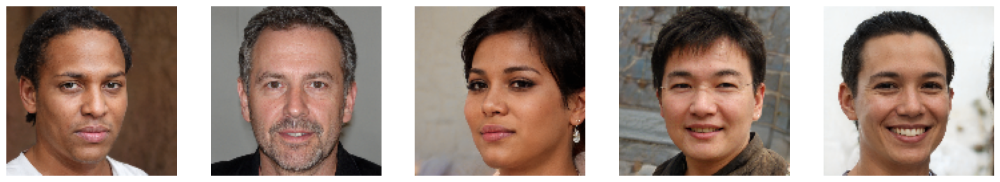

Generated Images in Domain B


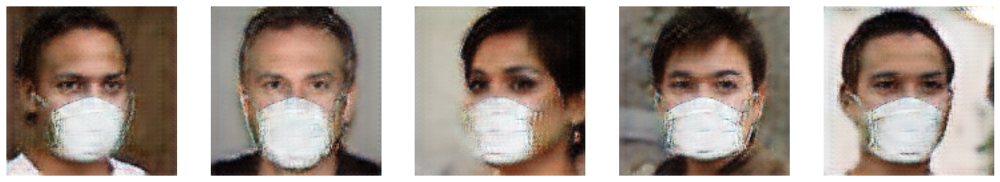

Reconstructed Images in Domain A


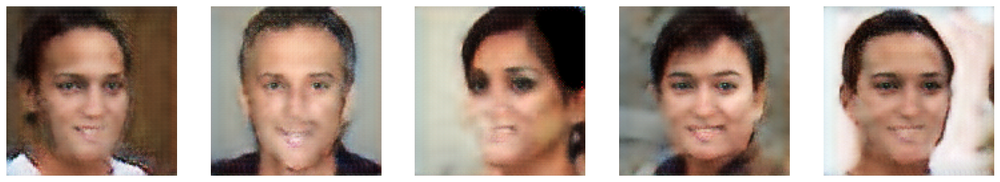

Time for epoch 1: 858.3243098258972 sec


Epoch 2: 100%|██████████| 625/625 [14:16<00:00,  1.37s/it]


Original Images from Domain A


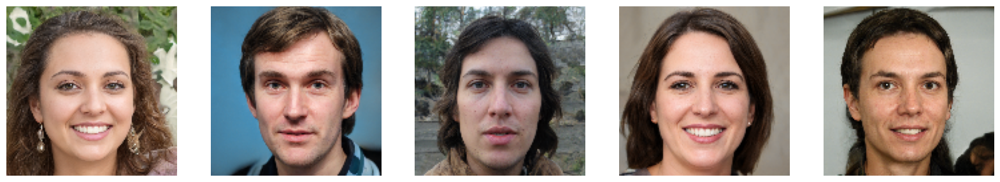

Generated Images in Domain B


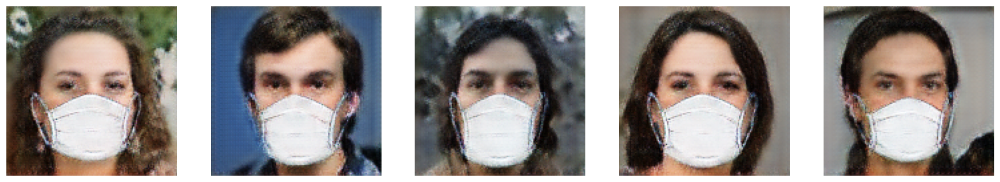

Reconstructed Images in Domain A


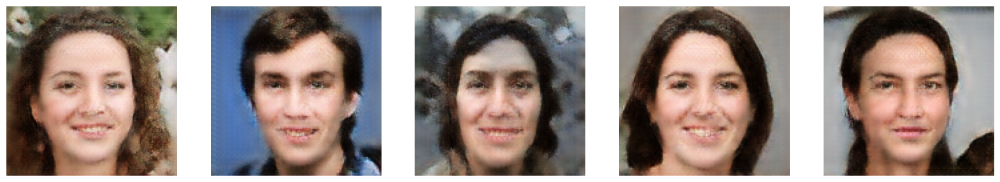

Time for epoch 2: 858.80220246315 sec


In [65]:
EPOCHS = 2

for epoch in range(EPOCHS):
    start = time.time()
    i = 0
    for real_A, real_B in tqdm(zip(train_ds_A, train_ds_B), desc=f"Epoch {epoch + 1}", total=min(len(train_ds_A), len(train_ds_B))):
        i += 1
        if i % 1000 == 0:
            print(f"Epoch {epoch + 1}, Iteration {i}")
        
        # Perform a training step
        train_step(real_A, real_B)

    # Generate and visualize images after each epoch
    if (epoch + 1) % 1 == 0:  # Visualize every epoch
        # Generate fake images
        fake_B = generator_A_to_B(real_A, training=False)
        fake_A = generator_B_to_A(real_B, training=False)

        # Reconstruct images using cycle-consistency
        cycled_A = generator_B_to_A(fake_B, training=False)
        cycled_B = generator_A_to_B(fake_A, training=False)

        # Plot original and generated images
        print("Original Images from Domain A")
        plot_array(real_A[:5])  # Plot first 5 images from domain A

        print("Generated Images in Domain B")
        plot_array(fake_B[:5])  # Plot first 5 generated images in domain B

        print("Reconstructed Images in Domain A")
        plot_array(cycled_A[:5])  # Plot first 5 reconstructed images in domain A

    print(f"Time for epoch {epoch + 1}: {time.time() - start} sec")